In [1]:
import skimage.io as sio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import diff_classifier.aws as aws
from skimage.filters import roberts, sobel, scharr, prewitt, median, rank
from skimage import img_as_ubyte
from skimage.morphology import erosion, dilation, opening, closing, white_tophat, disk, reconstruction
import diff_register.im_process as imp

In [10]:
filename = 'BF_cells_PEG_1_XY1.tif'
folder = 'Cell_Studies/10_16_18_cell_study'
bucket = 'ccurtis.data'
longname = folder+'/'+filename

In [7]:
aws.download_s3(longname, filename, bucket_name=bucket)

In [9]:
bfimage = plt.imread(filename)

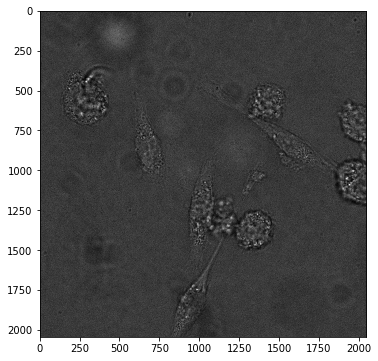

In [12]:
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(bfimage, cmap='gray')

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


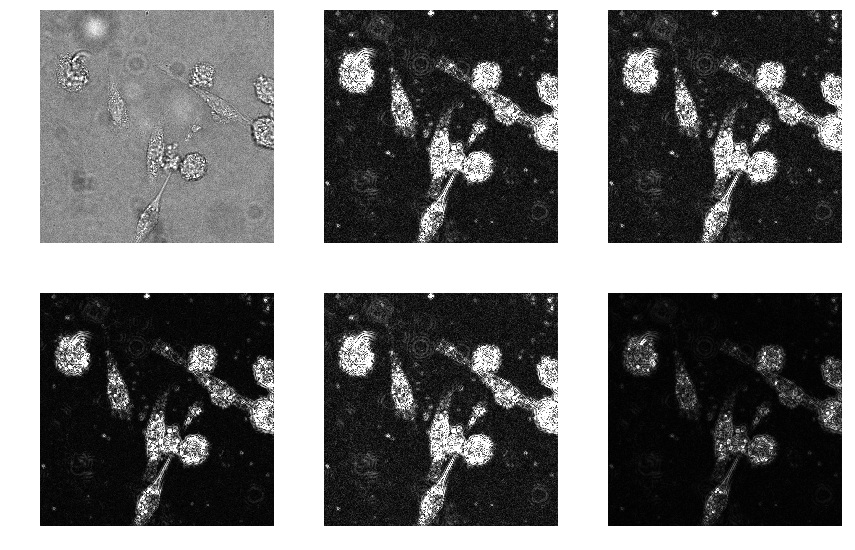

In [92]:
se = np.ones((10,10))
se1 = np.ones((5,5))
med = rank.mean(bfimage, se)
redge = opening(roberts(med), se1)
sedge = sobel(med)
schedge = scharr(med)
pedge = prewitt(med)
grad = rank.gradient(med, se1)
#med = rank.mean(bfimage, se)
#redge = rank.mean(roberts(med), se1)
#sedge = rank.mean(sobel(med), se1)
#schedge = rank.mean(scharr(med), se1)
#pedge = rank.mean(prewitt(med), se1)

vmax = 1000
vmax2 = 0.0004

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))
ax[0][0].imshow(bfimage, cmap='gray', vmax=vmax)
ax[1][0].imshow(redge, cmap='gray', vmax=vmax2)
ax[0][1].imshow(sedge, cmap='gray', vmax=vmax2)
ax[1][1].imshow(schedge, cmap='gray', vmax=vmax2)
ax[0][2].imshow(pedge, cmap='gray', vmax=vmax2)
ax[1][2].imshow(grad, cmap='gray', vmax=vmax/3)
for axes in ax:
    for axe in axes:
        axe.axis('off')
fig.tight_layout()

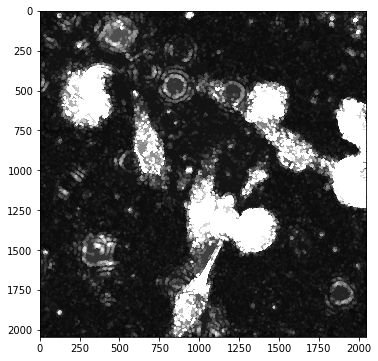

In [99]:
pedgeblur = opening(pedge, disk(7))*100

seed = np.copy(pedgeblur)
seed[1:-1, 1:-1] = pedgeblur.max()
mask = pedgeblur

filled = reconstruction(seed, mask, method='erosion')
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(filled, cmap='gray', vmax=0.01)

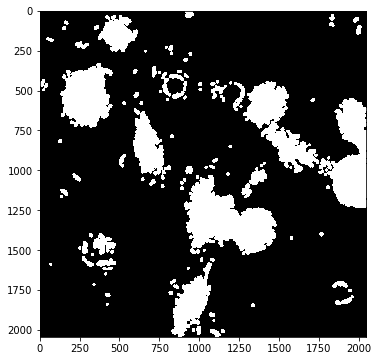

In [111]:
pedgeblur = opening(pedge, disk(10))*100
pedgebi = pedgeblur > 0.0025
seed = np.copy(pedgebi)
seed[1:-1, 1:-1] = pedgebi.max()
mask = pedgebi

filled = reconstruction(seed, mask, method='erosion')
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(filled, cmap='gray', vmax=0.01)
#plt.imsave('test.tif', filled)

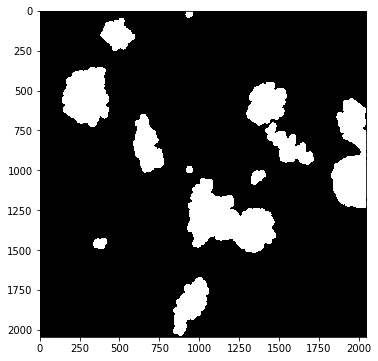

In [114]:
filledtop = filled - white_tophat(filled, disk(20))
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(filledtop, cmap='gray', vmax=0.01)

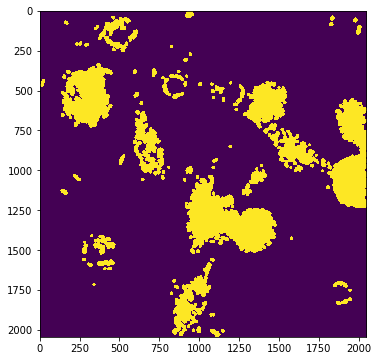

In [87]:
pedgebi = pedgeblur > 0.003
seed = np.copy(pedgebi)
seed[1:-1, 1:-1] = pedgebi.max()
mask = pedgebi

filled = reconstruction(seed, mask, method='erosion')

fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(filled)

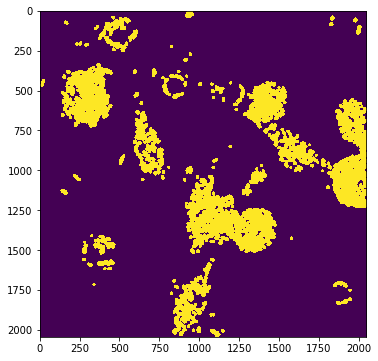

In [84]:
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(pedgebi)

In [13]:
#Building an overall function:

def binary_BF(image, meanse=disk(10), edgefilt='prewitt', opense=disk(10),
          fill_first=False, bi_thresh=0.000025, tophatse=disk(20)):
    
    #convertim = img_as_ubyte(image)
    meanim = rank.mean(image, meanse)
    if edgefilt is 'prewitt':
        edgeim = prewitt(meanim)
    elif edgefilt is 'sobel':
        edgeim = sobel(meanim)
    elif edgefilt is 'scharr':
        edgeim = scharr(meanim)
    elif edgefilt is 'roberts':
        edgeim = roberts(meanim)
    
    closeim = closing(edgeim, opense)
    openim = opening(closeim, opense)
    if fill_first:
        seed = np.copy(openim)
        seed[1:-1, 1:-1] = openim.max()
        mask = openim
        filledim = reconstruction(seed, mask, method='erosion')
        binarim = filledim > bi_thresh
    else:
        binarim = openim > bi_thresh*np.mean(openim)
        seed = np.copy(binarim)
        seed[1:-1, 1:-1] = binarim.max()
        mask = binarim
        filledim = reconstruction(seed, mask, method='erosion')

    tophim = filledim - closing(white_tophat(filledim, tophatse), opense)>0.01

    fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))
    ax[0][0].imshow(image, cmap='gray')
    ax[0][1].imshow(meanim, cmap='gray')
    ax[0][2].imshow(edgeim, cmap='gray', vmax=4*np.mean(edgeim))
    ax[0][3].imshow(closeim, cmap='gray', vmax=4*np.mean(closeim))
    ax[1][0].imshow(openim, cmap='gray', vmax=4*np.mean(openim))
    ax[1][1].imshow(binarim, cmap='gray')
    ax[1][2].imshow(filledim, cmap='gray')
    ax[1][3].imshow(tophim, cmap='gray')
    for axes in ax:
        for axe in axes:
            axe.axis('off')
    fig.tight_layout()
    
    return tophim

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


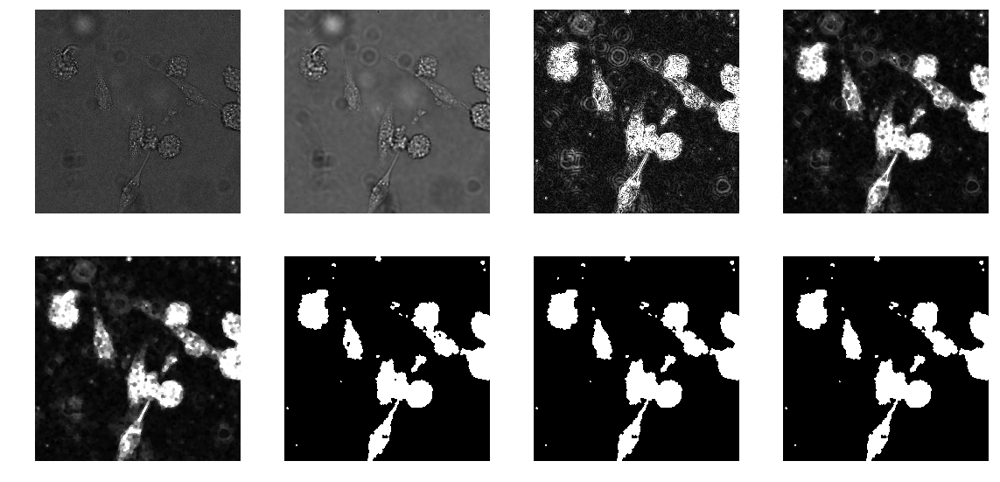

In [134]:
tophim = binary_BF(bfimage, bi_thresh=1.5, tophatse=disk(10))

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


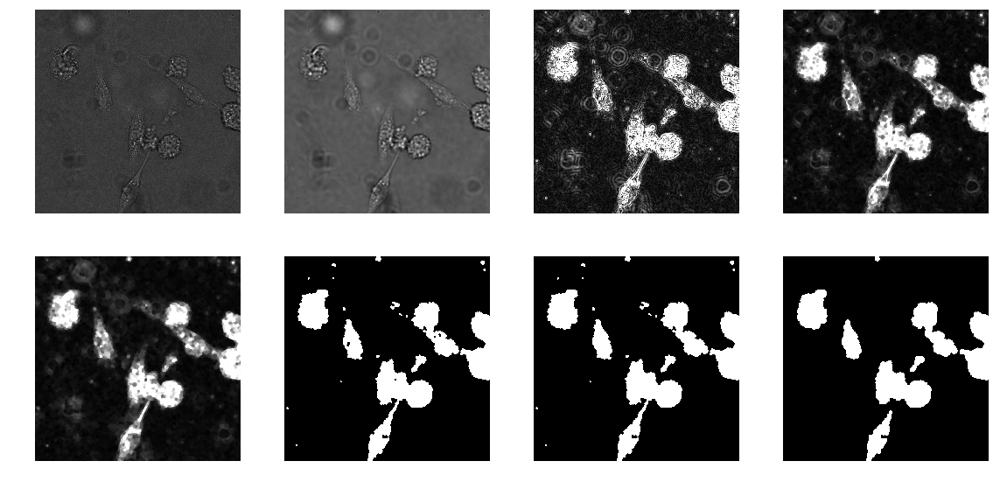

In [135]:
tophim = binary_BF(bfimage, bi_thresh=1.5, tophatse=disk(20))

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


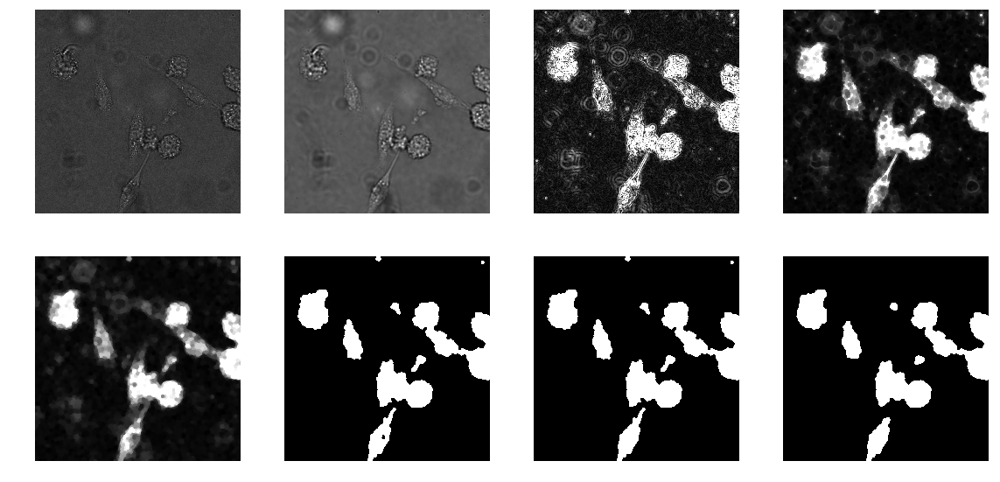

In [136]:
tophim = binary_BF(bfimage, opense=disk(15), bi_thresh=1.5, tophatse=disk(25))

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


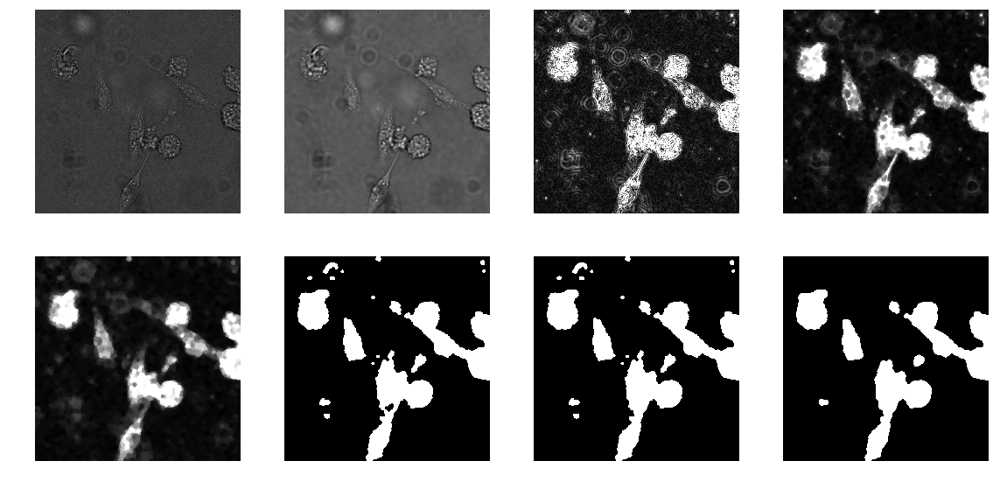

In [143]:
tophim = binary_BF(bfimage, opense=disk(15), bi_thresh=1.15, tophatse=disk(27))

In [147]:
filename = 'BF_cells_PEG_1_XY2.tif'
longname = folder+filename
aws.download_s3(longname, filename, bucket_name=bucket)
bfimage2 = plt.imread(filename)

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


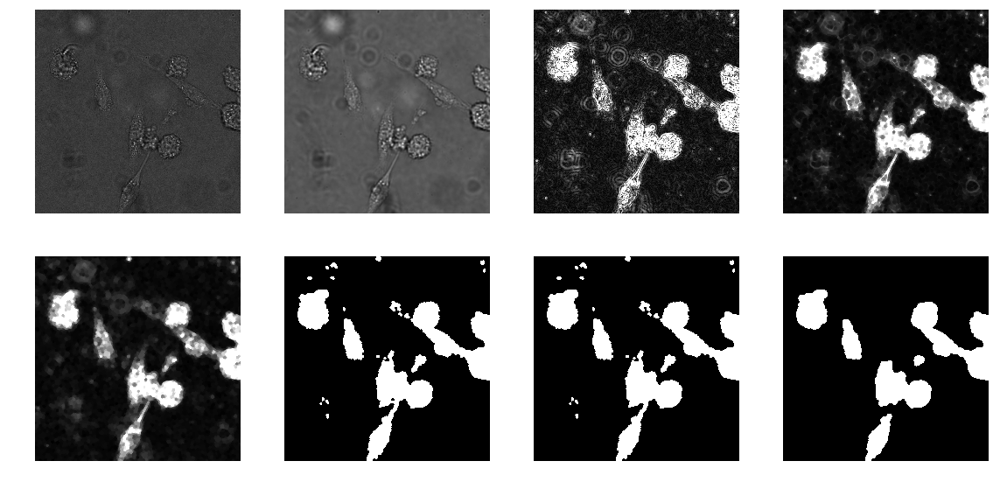

In [145]:
tophim = binary_BF(bfimage, opense=disk(12), bi_thresh=1.25, tophatse=disk(27))

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


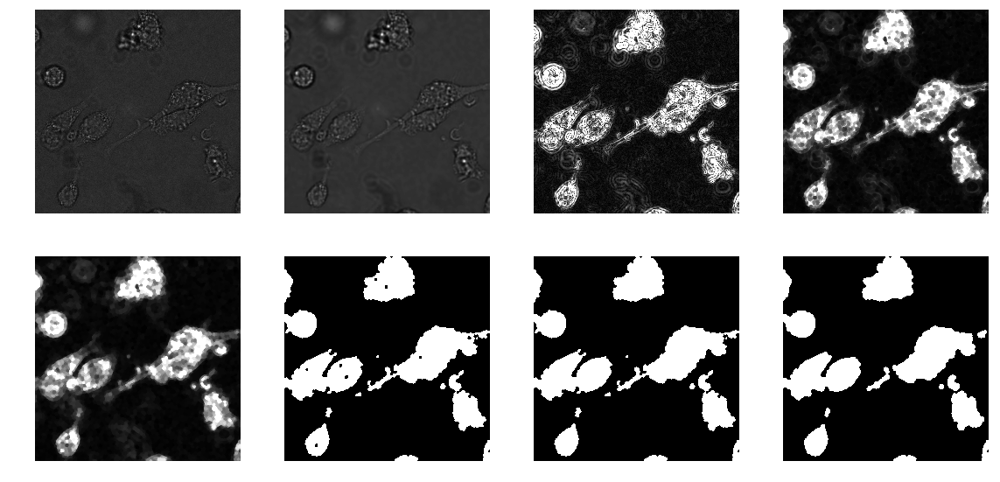

In [149]:
tophim = binary_BF(bfimage2, opense=disk(12), bi_thresh=1.2, tophatse=disk(20))

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


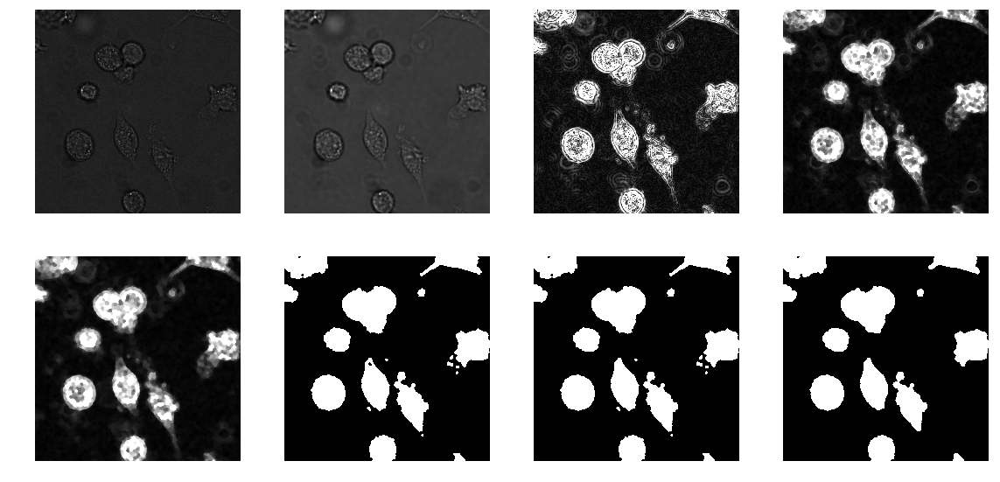

In [150]:
filename = 'BF_cells_PEG_1_XY3.tif'
longname = folder+filename
aws.download_s3(longname, filename, bucket_name=bucket)
bfimage3 = plt.imread(filename)
tophim = binary_BF(bfimage3, opense=disk(12), bi_thresh=1.2, tophatse=disk(20))

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


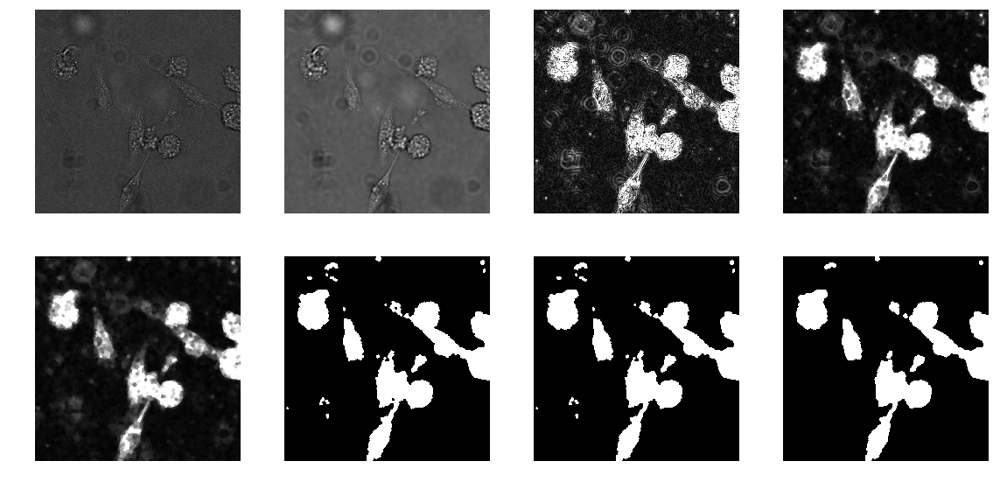

In [14]:
filename = 'BF_cells_PEG_1_XY1.tif'
longname = folder+'/'+filename
aws.download_s3(longname, filename, bucket_name=bucket)
bfimage3 = plt.imread(filename)
tophim = binary_BF(bfimage3, opense=disk(12), bi_thresh=1.2, tophatse=disk(20))

In [15]:
filename = 'features_{}_{}_XY{}.csv'.format(typ, slic, num)
aws.download_s3('{}/{}'.format(folder, filename), filename, bucket_name=bucket)
fstats = pd.read_csv(filename, encoding = "ISO-8859-1", index_col='Unnamed: 0')

In [ ]:
fig, ax = plt.subplots(figsize=(12,12))
ax.imshow(tophim, cmap='gray')
ax.scatter(fstats.X.values, fstats.Y.values, s=10, c=fstats['Cell Status'])
ax.axis('off')

In [66]:
cell_status = [tophim[int(fstats.Y[i]-1), int(fstats.X[i])-1] for i in range(len(fstats.X))]

In [68]:
to_track = []
result_futures = {}

remote_folder = 'Cell_Studies/10_16_18_cell_study' #Folder in AWS S3 containing files to be analyzed
bucket = 'ccurtis.data'
vids = 5
types = ['PS', 'PEG']
slices = [1, 2]

for typ in types:
    for slic in slices:
        for num in range(1, vids+1):
            #to_track.append('100x_0_4_1_2_gel_{}_bulk_vid_{}'.format(vis, num))
            to_track.append('{}_{}_XY{}'.format(typ, slic, num))

/home/ubuntu/miniconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)


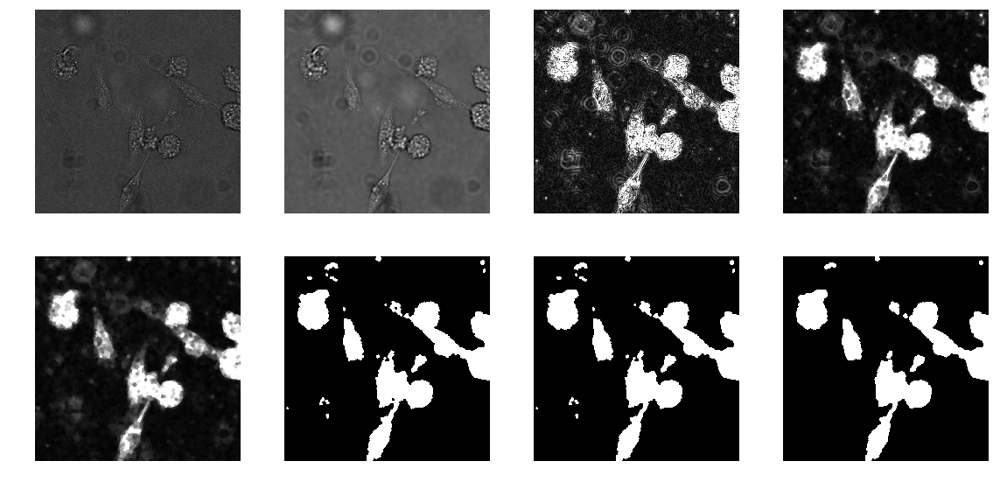

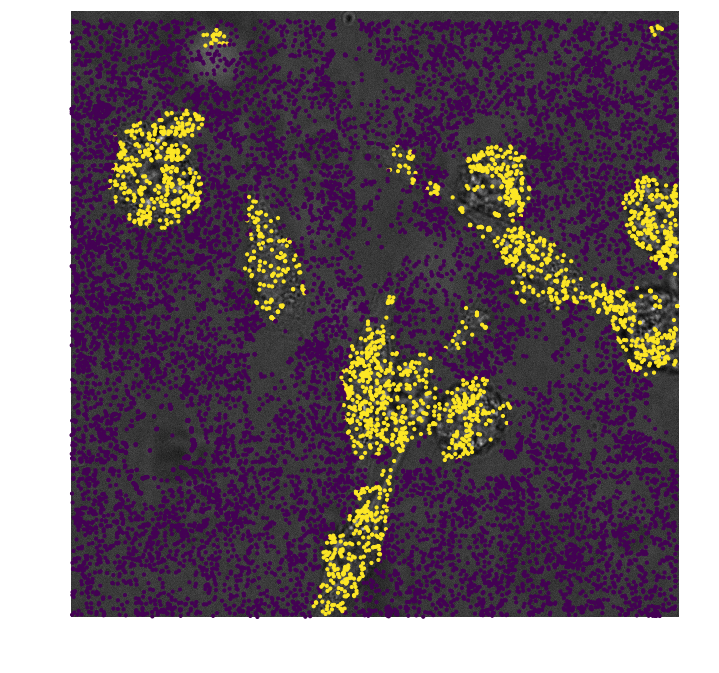

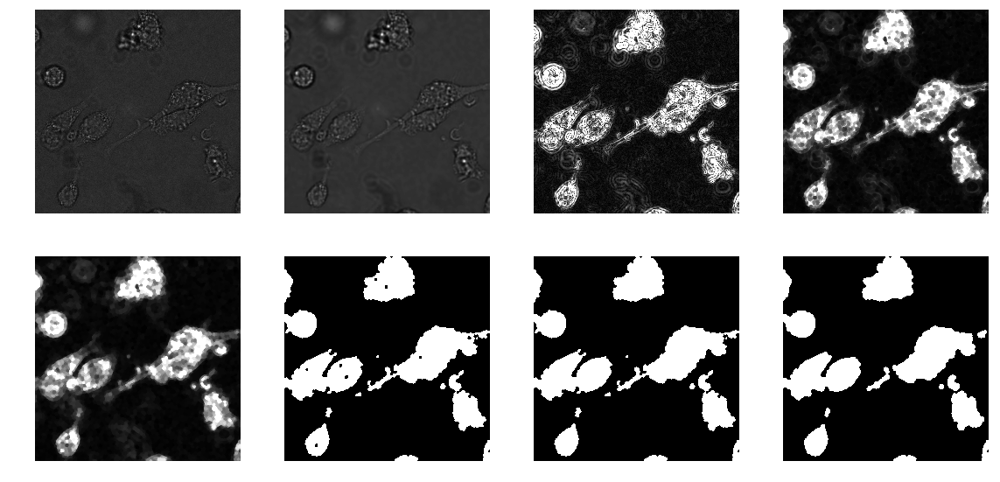

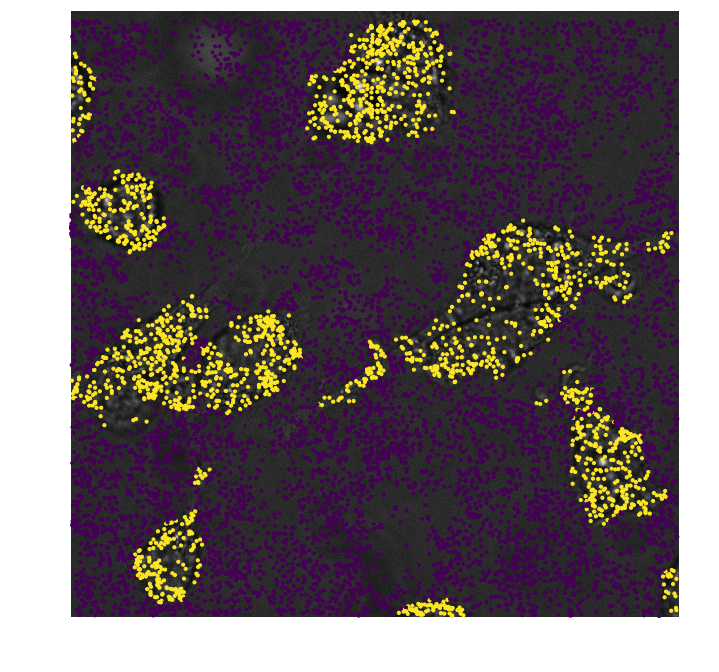

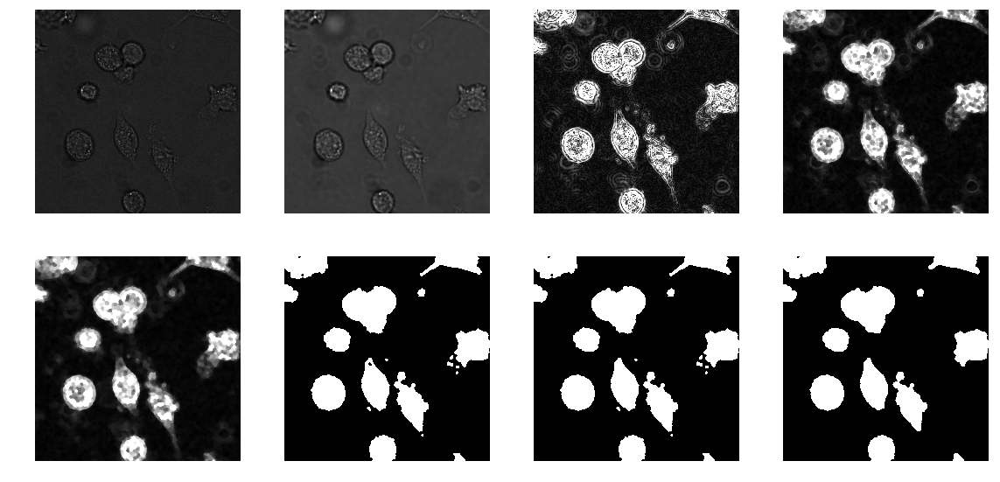

...

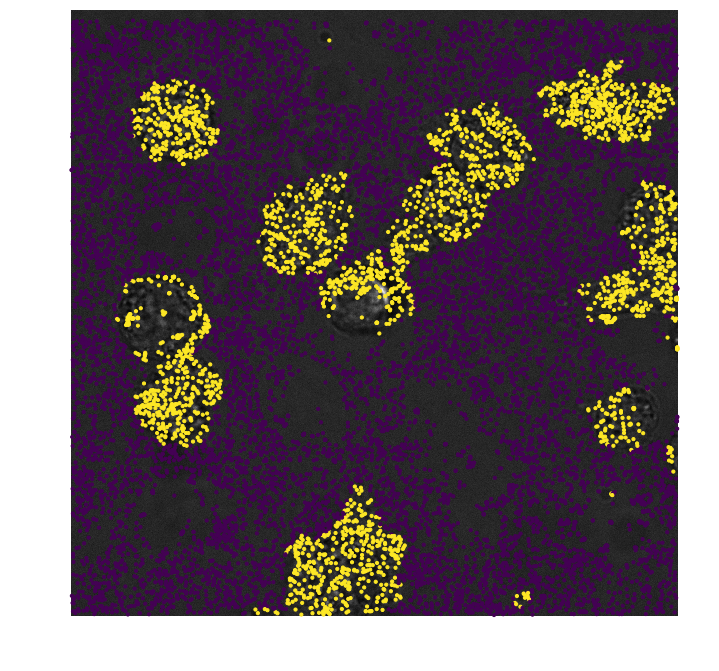

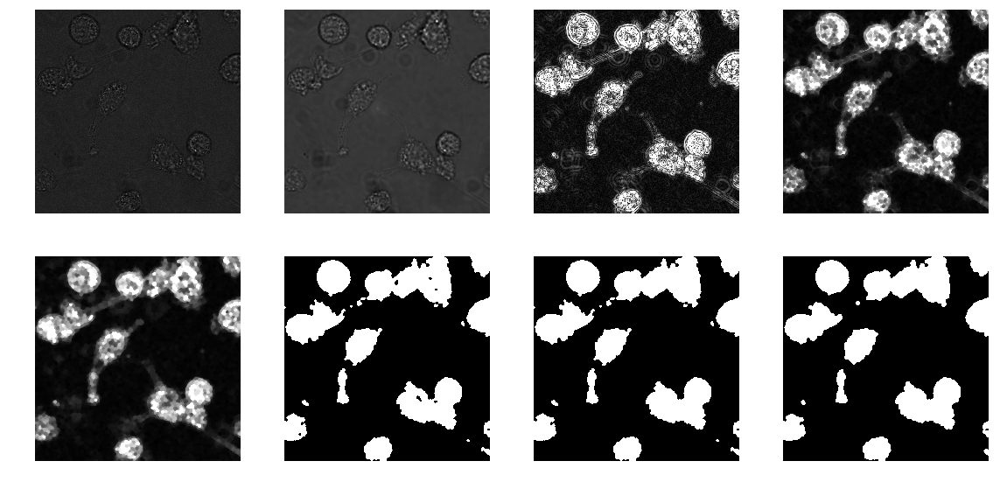

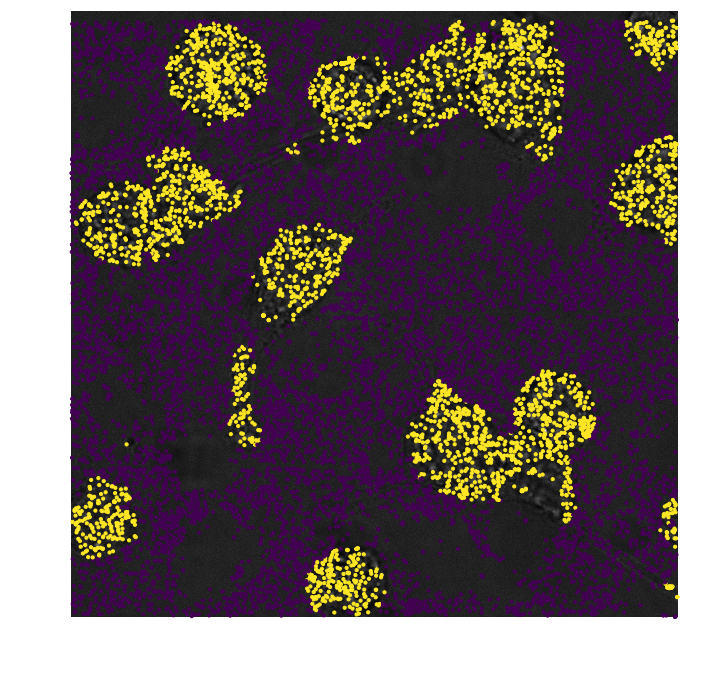

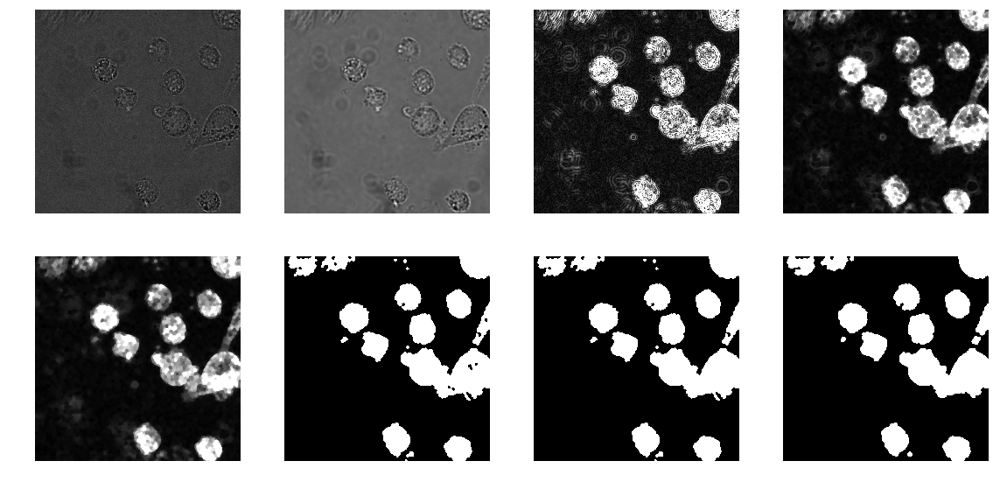

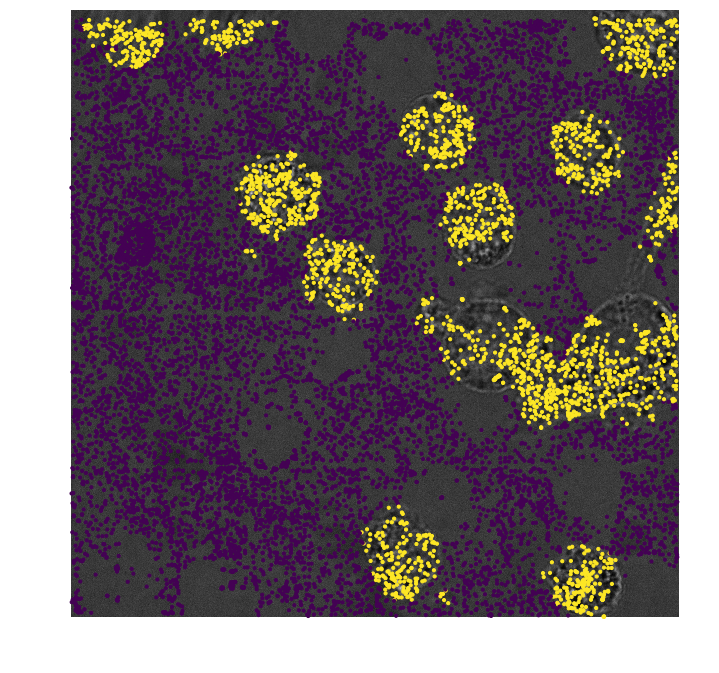

In [80]:
for track in to_track[10:]:
    filename = 'features_{}.csv'.format(track)
    aws.download_s3('{}/{}'.format(folder, filename), filename, bucket_name=bucket)
    fstats = pd.read_csv(filename, encoding = "ISO-8859-1", index_col='Unnamed: 0')
    
    bfilename = 'BF_cells_{}.tif'.format(track)
    longname = folder+'/'+bfilename
    aws.download_s3(longname, bfilename, bucket_name=bucket)
    bfimage3 = plt.imread(bfilename)
    tophim = binary_BF(bfimage3, opense=disk(12), bi_thresh=1.2, tophatse=disk(20))
    biim = 'bi_BF_cells_{}.tif'.format(track)
    plt.imsave(biim, tophim)
    aws.upload_s3(biim, '{}/{}'.format(folder, biim), bucket_name=bucket)
    
    fstats['Cell Status'] = [tophim[int(fstats.Y[i]-1), int(fstats.X[i])-1] for i in range(len(fstats.X))]
    fstats.to_csv(filename, sep=',', encoding = "ISO-8859-1")
    aws.upload_s3(filename, '{}/{}'.format(folder, filename), bucket_name=bucket)
    
    fig, ax = plt.subplots(figsize=(12,12))
    ax.imshow(bfimage3, cmap='gray')
    ax.scatter(fstats.X.values, fstats.Y.values, s=10, c=fstats['Cell Status'])
    ax.axis('off')
    overim = 'ov_BF_cells_{}.png'.format(track)
    plt.savefig(overim)
    aws.upload_s3(overim, '{}/{}'.format(folder, overim), bucket_name=bucket)